In [1]:
import cv2
from google.colab.patches import cv2_imshow
import glob
import numpy as np
import matplotlib.pyplot as plt

#  1. correspondence points

In [9]:
CHECKERBOARD = (7,7)
criteria = (cv2.TERM_CRITERIA_EPS +cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
objectp3d = np.zeros((1, CHECKERBOARD[0]* CHECKERBOARD[1],3), np.float32)
objectp3d[0, :, :2] = np.mgrid[0:14:2,0:14:2].T.reshape(-1, 2) # since each grid is 2*2 cm^2


## Object Points

In [11]:
print("object points: ", objectp3d)

object points:  [[[ 0.  0.  0.]
  [ 2.  0.  0.]
  [ 4.  0.  0.]
  [ 6.  0.  0.]
  [ 8.  0.  0.]
  [10.  0.  0.]
  [12.  0.  0.]
  [ 0.  2.  0.]
  [ 2.  2.  0.]
  [ 4.  2.  0.]
  [ 6.  2.  0.]
  [ 8.  2.  0.]
  [10.  2.  0.]
  [12.  2.  0.]
  [ 0.  4.  0.]
  [ 2.  4.  0.]
  [ 4.  4.  0.]
  [ 6.  4.  0.]
  [ 8.  4.  0.]
  [10.  4.  0.]
  [12.  4.  0.]
  [ 0.  6.  0.]
  [ 2.  6.  0.]
  [ 4.  6.  0.]
  [ 6.  6.  0.]
  [ 8.  6.  0.]
  [10.  6.  0.]
  [12.  6.  0.]
  [ 0.  8.  0.]
  [ 2.  8.  0.]
  [ 4.  8.  0.]
  [ 6.  8.  0.]
  [ 8.  8.  0.]
  [10.  8.  0.]
  [12.  8.  0.]
  [ 0. 10.  0.]
  [ 2. 10.  0.]
  [ 4. 10.  0.]
  [ 6. 10.  0.]
  [ 8. 10.  0.]
  [10. 10.  0.]
  [12. 10.  0.]
  [ 0. 12.  0.]
  [ 2. 12.  0.]
  [ 4. 12.  0.]
  [ 6. 12.  0.]
  [ 8. 12.  0.]
  [10. 12.  0.]
  [12. 12.  0.]]]


In [ ]:
threedpoints = []
twodpoints = []
images = glob.glob("*.jpeg")

#2. Corner Pixels

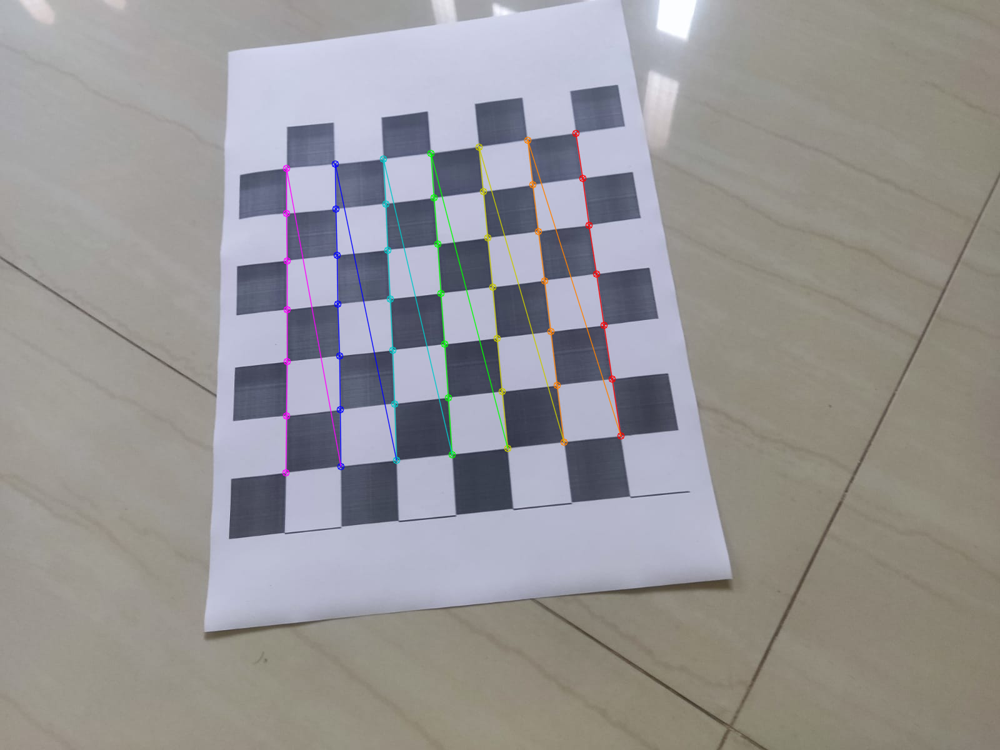

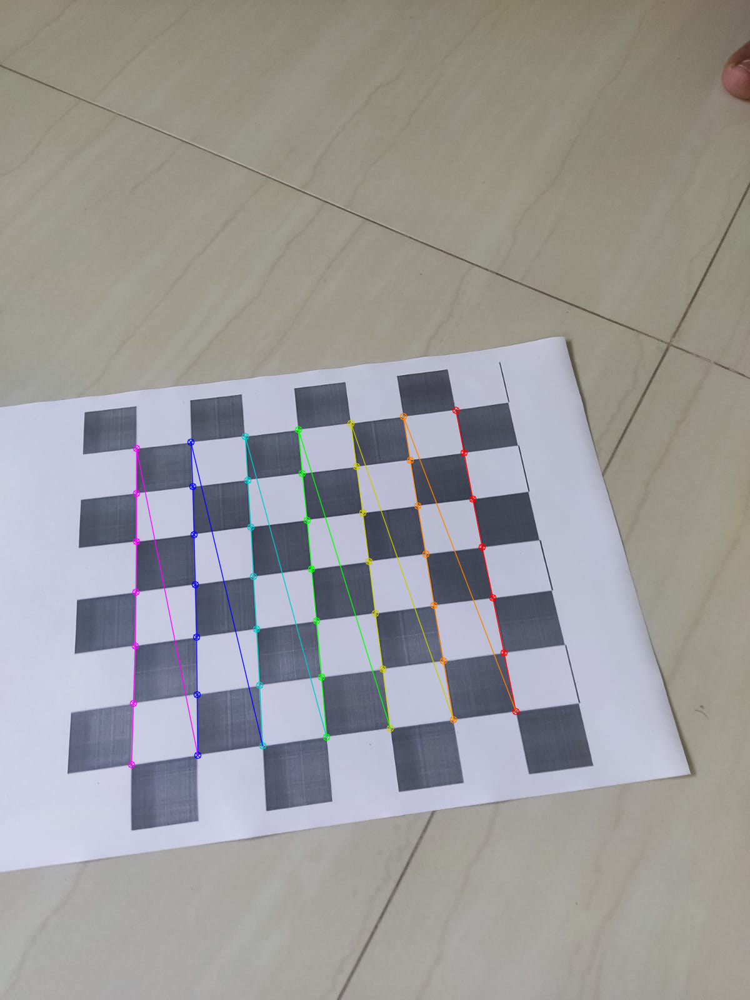

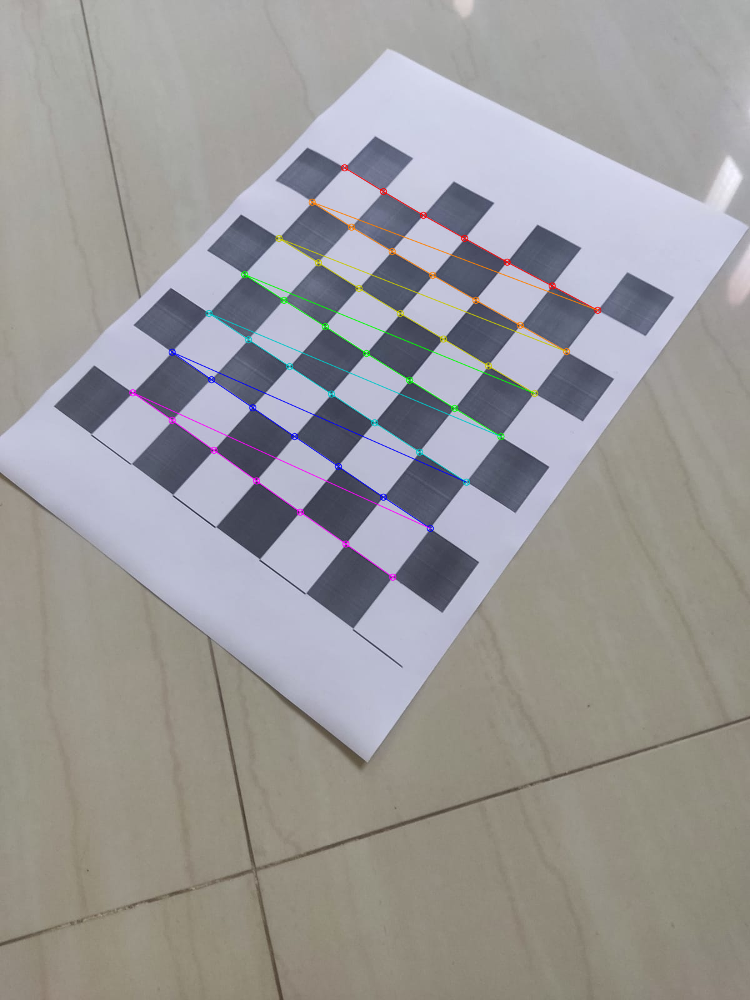

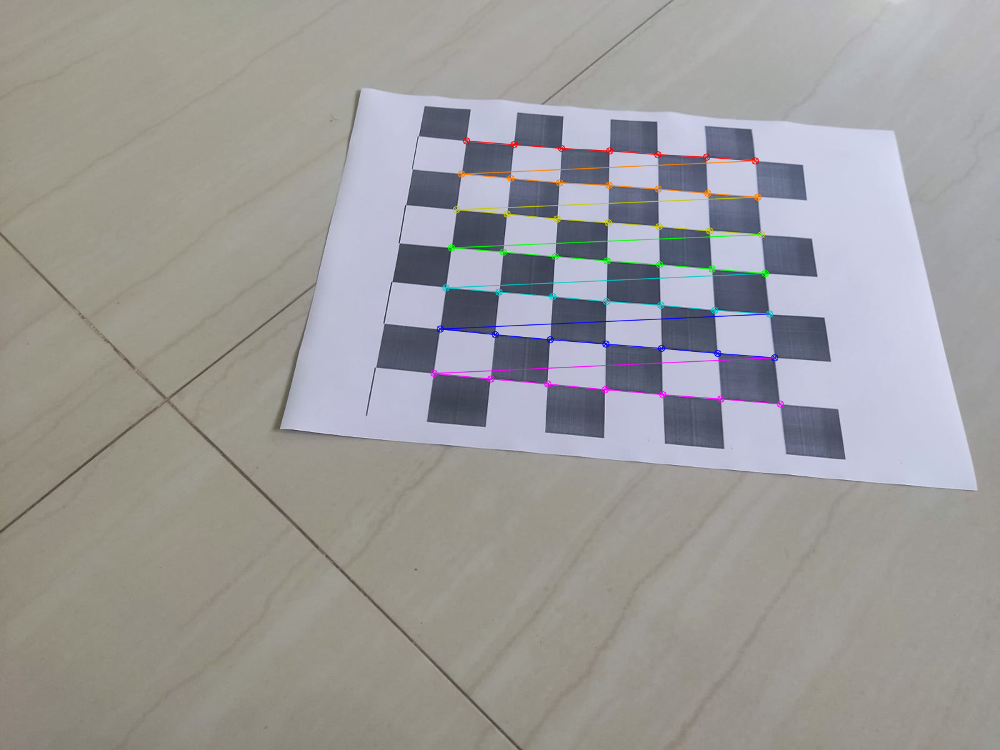

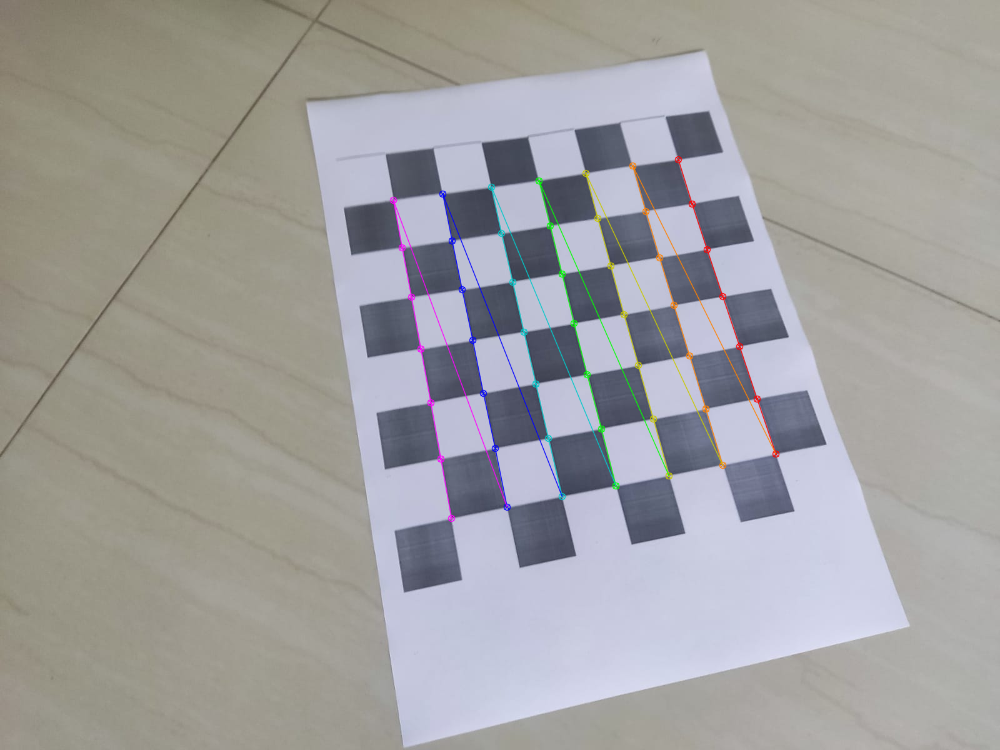

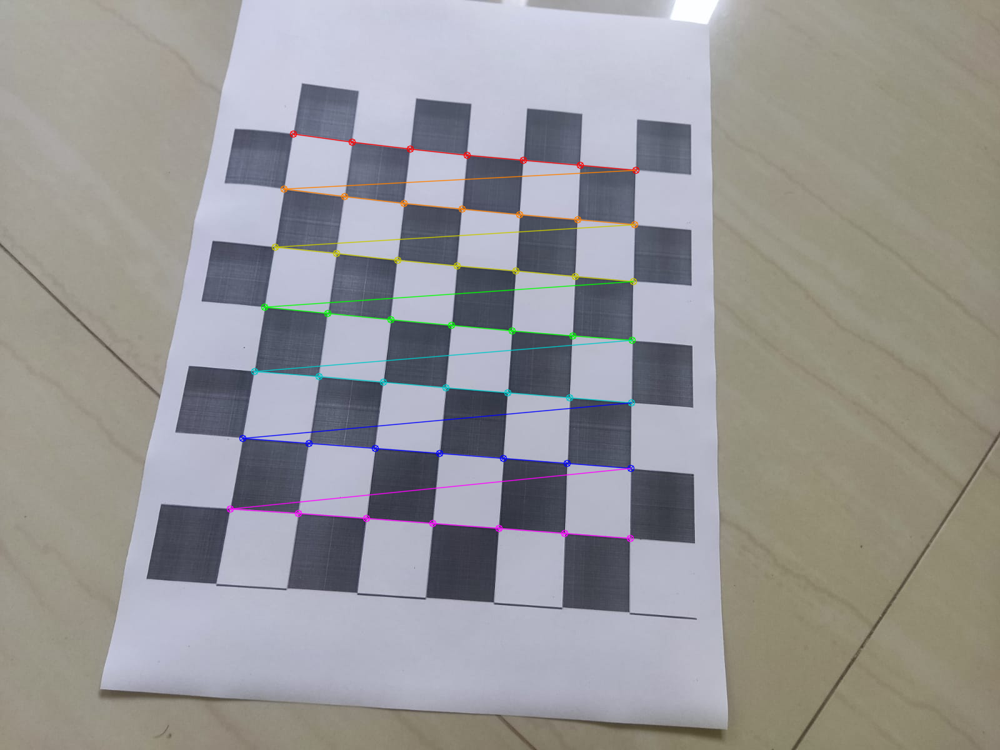

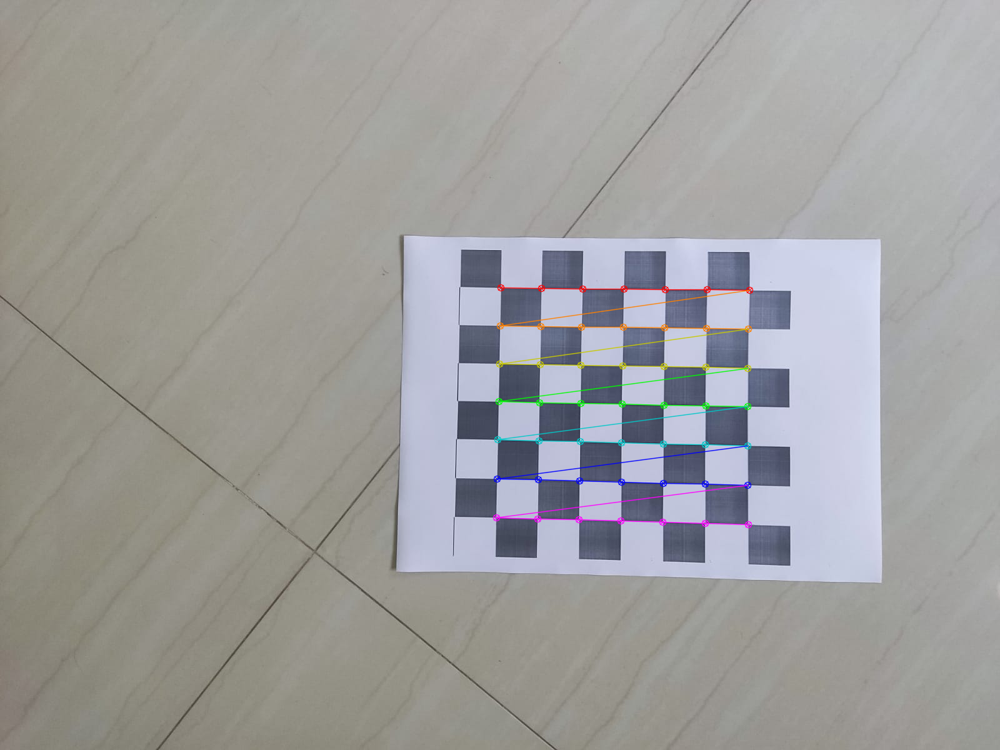

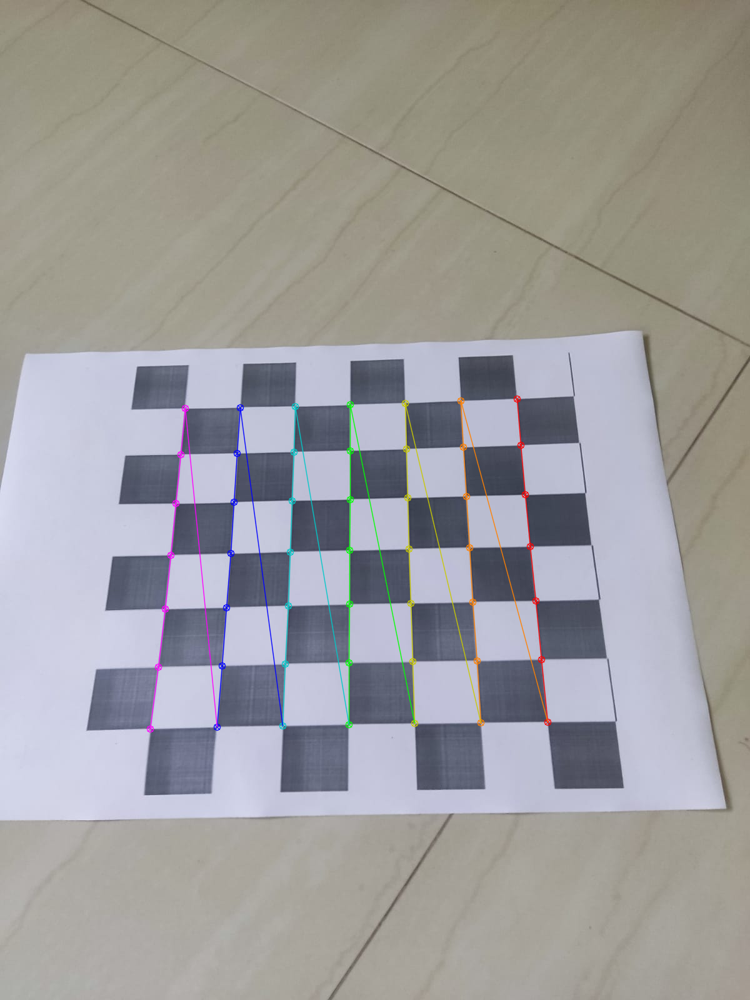

In [ ]:
for filename in images:
    image = cv2.imread(filename)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
 
    # Find the chess board corners
    # If desired number of corners are
    # found in the image then ret = true
    ret, corners = cv2.findChessboardCorners(gray, CHECKERBOARD,None)
 
    # If desired number of corners can be detected then,
    # refine the pixel coordinates and display
    # them on the images of checker board
    if ret == True:
        threedpoints.append(objectp3d)
 
        # Refining pixel coordinates
        # for given 2d points.
        corners2 = cv2.cornerSubPix(gray, corners, (11, 11), (-1, -1), criteria)
 
        twodpoints.append(corners2)
 
        # Draw and display the corners
        image = cv2.drawChessboardCorners(image,CHECKERBOARD,corners2, ret)
 
    cv2_imshow(image)
    cv2.waitKey(0)


#3. Calibration

In [ ]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(threedpoints, twodpoints, gray.shape[::-1], None, None)

In [ ]:
print("camera matrix: \n", mtx)

camera matrix: 
 [[2.28803366e+03 0.00000000e+00 7.28922918e+02]
 [0.00000000e+00 3.16537537e+03 9.09406098e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]


In [ ]:
print("lens distortion parameters: \n", dist)

lens distortion parameters: 
 [[-4.77157709e-01  1.07315185e+01 -2.37624427e-02  1.50192530e-04
  -7.11545257e+01]]


In [ ]:
img = cv2.imread('1.jpeg')
h,  w = img.shape[:2]
newcameramtx, roi = cv2.getOptimalNewCameraMatrix(mtx, dist, (w,h), 1, (w,h))

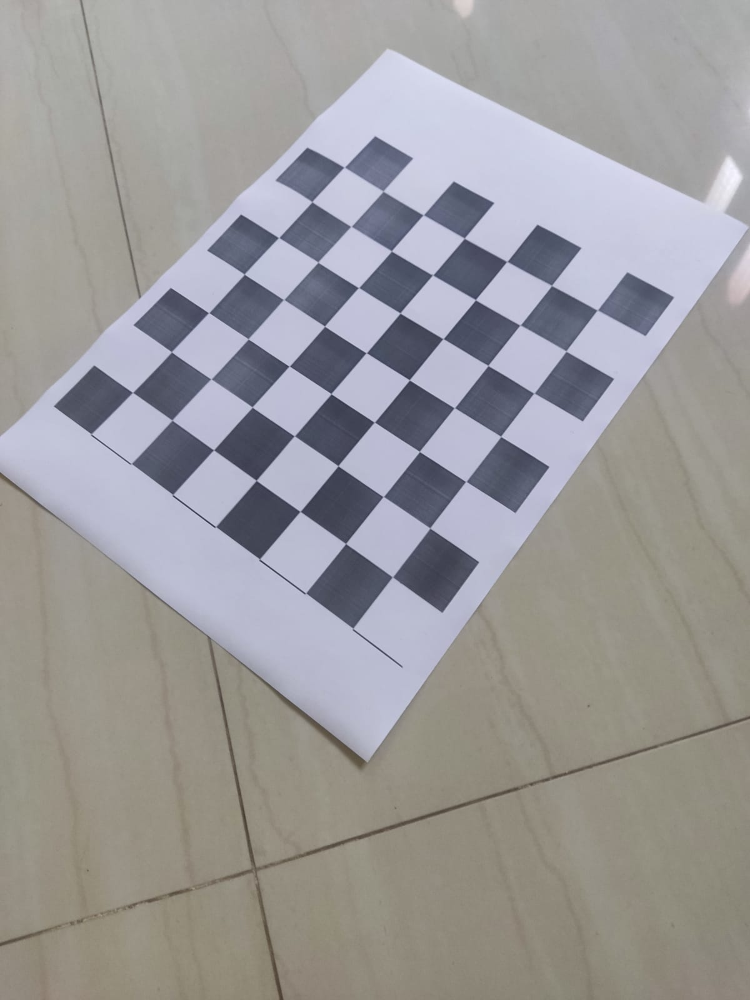

In [ ]:
cv2_imshow(img)

In [ ]:
# undistort
dst = cv2.undistort(img, mtx, dist, None, newcameramtx)
# crop the image
x, y, w, h = roi
dst = dst[y:y+h, x:x+w]
cv2.imwrite('calibresult.png', dst)

True

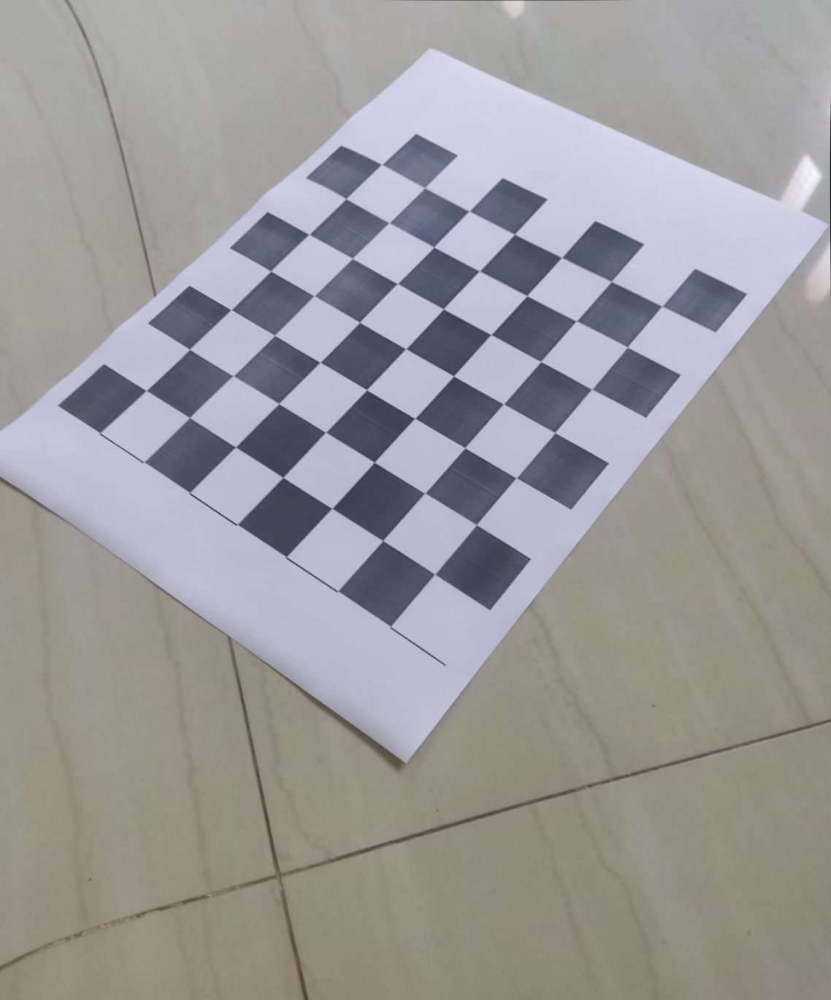

In [ ]:
cv2_imshow(dst)

# 4. Reprojection Error

In [ ]:
tot_error=0
total_points=0
for i in range(len(threedpoints)):
    reprojected_points,_ = cv2.projectPoints(threedpoints[i], rvecs[i], tvecs[i], mtx, dist)
    error = cv2.norm(twodpoints[i], reprojected_points, cv2.NORM_L2)/len(reprojected_points)
    tot_error += error

mean_error=(tot_error/len(threedpoints))
print("Mean reprojection error: ", mean_error)

Mean reprojection error:  0.33390107530871216


# 5. with dot grid

In [4]:
grid = (10,10)

# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# Setup SimpleBlobDetector parameters.
blobParams = cv2.SimpleBlobDetector_Params()


blobParams.minThreshold = 8
blobParams.maxThreshold = 255

# Filter by Area.
blobParams.filterByArea = True
blobParams.minArea = 64     
blobParams.maxArea = 2500   

# Filter by Circularity
blobParams.filterByCircularity = True
blobParams.minCircularity = 0.1

# Filter by Convexity
blobParams.filterByConvexity = True
blobParams.minConvexity = 0.87

# Filter by Inertia
blobParams.filterByInertia = True
blobParams.minInertiaRatio = 0.01

# Create a detector with the parameters
blobDetector = cv2.SimpleBlobDetector_create(blobParams)



# Original blob coordinates, supposing all blobs are of z-coordinates 0
# And, the distance between every two neighbour blob circle centers is 72 centimetres
# In fact, any number can be used to replace 72.
# Namely, the real size of the circle is pointless while calculating camera calibration parameters.
objp = np.zeros((10*10,3), np.float32)
objp[:,:2] = np.mgrid[0:10,0:10].T.reshape(-1,2)

objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.

images = glob.glob("*.jpeg")

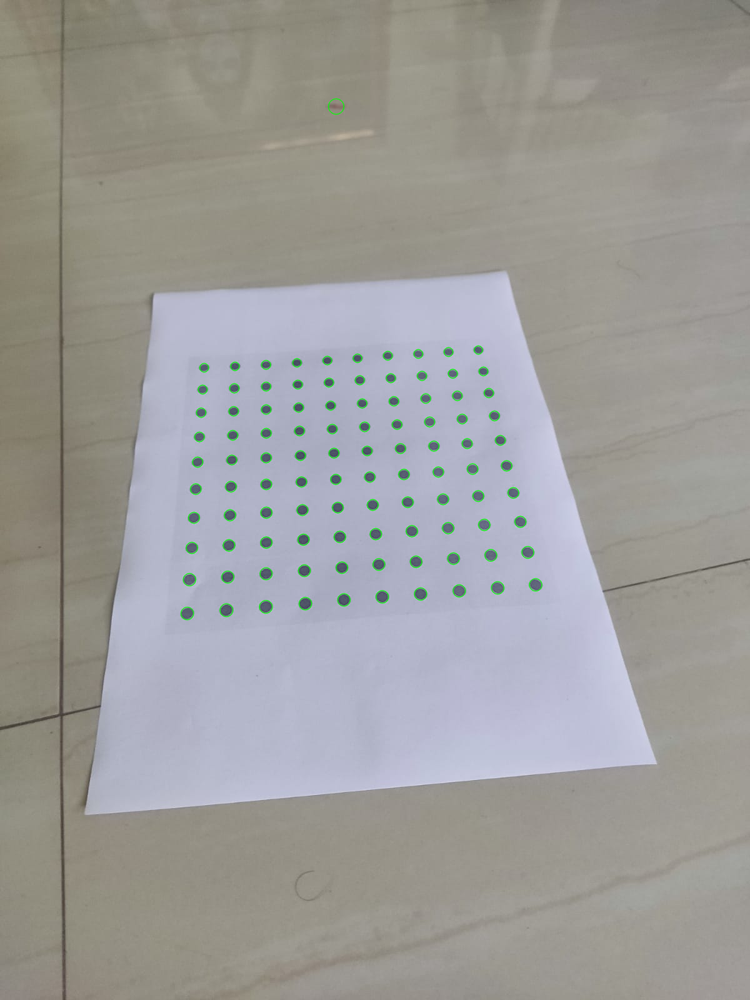

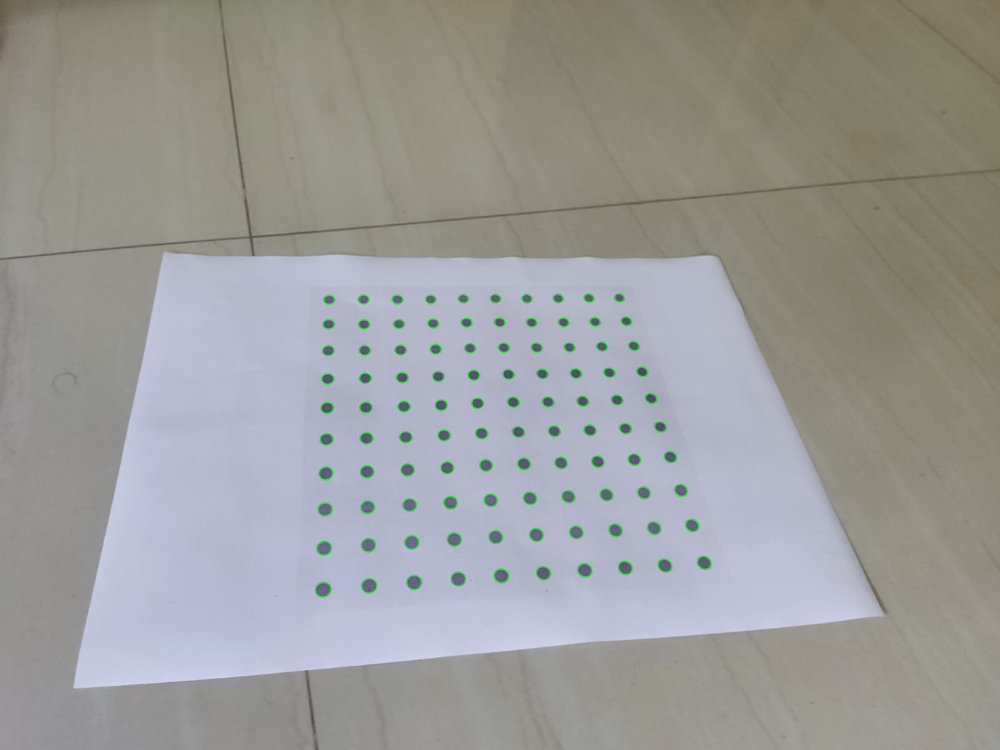

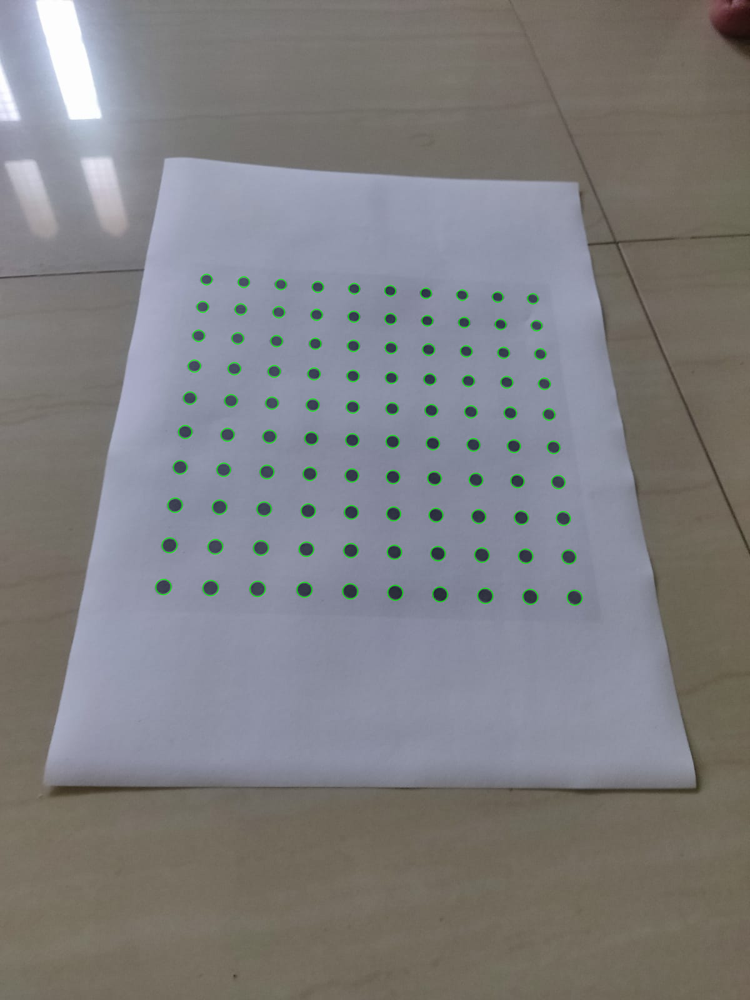

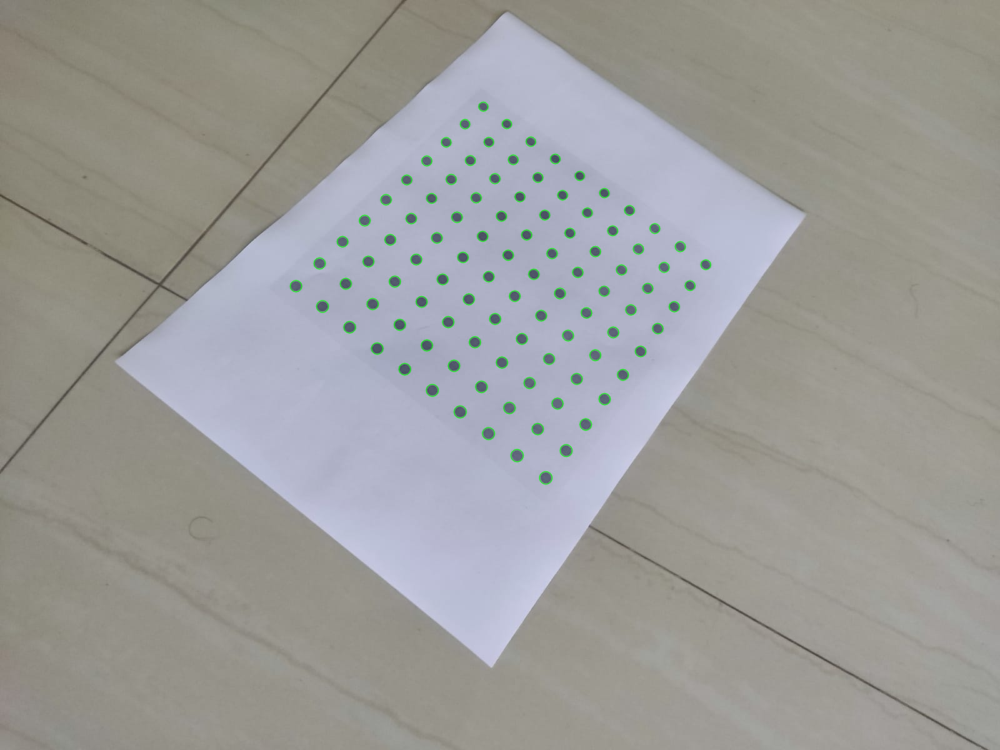

In [6]:
for filename in images:
    img = cv2.imread(filename)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    keypoints = blobDetector.detect(gray)
    im_with_keypoints = cv2.drawKeypoints(img, keypoints, np.array([]), (0,255,0), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    im_with_keypoints_gray = cv2.cvtColor(im_with_keypoints, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findCirclesGrid(im_with_keypoints, (4,11), None, flags = cv2.CALIB_CB_ASYMMETRIC_GRID)
    if ret == True:
        objpoints.append(objp)  # Certainly, every loop objp is the same, in 3D.

        corners2 = cv2.cornerSubPix(im_with_keypoints_gray, corners, (11,11), (-1,-1), criteria)    # Refines the corner locations.
        imgpoints.append(corners2)

        # Draw and display the corners.
        im_with_keypoints = cv2.drawChessboardCorners(img, (4,11), corners2, ret)
        found += 1

    cv2_imshow(im_with_keypoints) # display
    cv2.waitKey(2)

In [ ]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)